https://youtu.be/nCMDZEScF-4

**Nuclei segmentation in whole slide H&E images**

using pre-trained StarDist model.

This is pretty much all taken from Dr. Sreenivas Bhattiprolu's github:
https://github.com/bnsreenu/python_for_microscopists/blob/master/281_Segmenting_WSI_using_StarDist.ipynb

In [1]:
!pip install stardist

  Using cached csbdeep-0.7.4-py2.py3-none-any.whl.metadata (2.5 kB)
  Using cached imageio-2.31.6-py3-none-any.whl.metadata (4.6 kB)
  Using cached tqdm-4.66.1-py3-none-any.whl.metadata (57 kB)
     ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
     ------ --------------------------------- 0.4/2.1 MB 7.4 MB/s eta 0:00:01
     ------------------- -------------------- 1.0/2.1 MB 10.8 MB/s eta 0:00:01
     ------------------------------- -------- 1.6/2.1 MB 11.5 MB/s eta 0:00:01
     ---------------------------------------- 2.1/2.1 MB 12.0 MB/s eta 0:00:00
     ---------------------------------------- 0.0/4.2 MB ? eta -:--:--
     ------- -------------------------------- 0.7/4.2 MB 15.7 MB/s eta 0:00:01
     ---------------- ----------------------- 1.7/4.2 MB 18.3 MB/s eta 0:00:01
     ----------------------- ---------------- 2.4/4.2 MB 17.0 MB/s eta 0:00:01
     ----------------------------- ---------- 3.1/4.2 MB 16.6 MB/s eta 0:00:01
     ----------------------------

  You can safely remove it manually.


In [2]:
# To read Tiff files on Colab we need to install imagecodecs library
!pip install imagecodecs  

     ---------------------------------------- 0.0/24.7 MB ? eta -:--:--
     ---------------------------------------- 0.1/24.7 MB 2.8 MB/s eta 0:00:09
     - -------------------------------------- 0.7/24.7 MB 7.1 MB/s eta 0:00:04
     -- ------------------------------------- 1.6/24.7 MB 11.0 MB/s eta 0:00:03
     ---- ----------------------------------- 2.5/24.7 MB 13.5 MB/s eta 0:00:02
     ----- ---------------------------------- 3.5/24.7 MB 14.9 MB/s eta 0:00:02
     ------- -------------------------------- 4.6/24.7 MB 16.2 MB/s eta 0:00:02
     --------- ------------------------------ 5.6/24.7 MB 17.0 MB/s eta 0:00:02
     ---------- ----------------------------- 6.4/24.7 MB 17.1 MB/s eta 0:00:02
     ----------- ---------------------------- 7.2/24.7 MB 17.1 MB/s eta 0:00:02
     ------------ --------------------------- 8.0/24.7 MB 17.1 MB/s eta 0:00:01
     -------------- ------------------------- 8.8/24.7 MB 17.5 MB/s eta 0:00:01
     --------------- ------------------------ 9.6/

In [54]:
import numpy as np
import matplotlib.pyplot as plt

from tifffile import imread, imsave
from csbdeep.utils import Path, normalize
from csbdeep.utils.tf import keras_import
keras = keras_import()

from stardist import export_imagej_rois, random_label_cmap
from stardist.models import StarDist2D

np.random.seed(0)
cmap = random_label_cmap()

In [52]:
def show_image(img, crop_x, crop_y, tile_size, **kwargs):
    """Plot large image at different resolutions."""
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))

    # Plot the original image on the left
    ax[0].imshow(img, **kwargs)

    # Crop the image
    cropped_img = img[crop_y:crop_y+tile_size, crop_x:crop_x+tile_size]

    # Plot the cropped image on the right
    ax[1].imshow(cropped_img, **kwargs)

    ax[0].axis('off')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()

In [27]:
import os

pth = r'\\10.99.68.178\andreex\data\monkey fetus\gestational 40\1024tiles'  # path of ndpi files
WSIs = [_ for _ in os.listdir(pth) if _.endswith('ndpi')]

pth_mat = r'\\10.99.68.178\andreex\data\monkey fetus\gestational 40\1024tiles\10x\matfiles'
crop_mats = [_ for _ in os.listdir(pth_mat) if _.endswith('mat')]

In [11]:
imgs = []

for file in WSIs:
    im = imread(os.path.join(pth,file))
    imgs.append(im)

In [12]:
for img in imgs:
    print(img.shape)

(29568, 32640, 3)
(30976, 36480, 3)
(29568, 36480, 3)
(30976, 36480, 3)
(28160, 34560, 3)
(28160, 36480, 3)
(25344, 36480, 3)


In [38]:
from scipy.io import loadmat

def get_crop_info(crop_mat_file_path, ratio) -> tuple:
    data = loadmat(crop_mat_file_path)
    crop_width = int(data['crop_width']*ratio)
    crop_x = int(data['crop_x']*ratio)
    crop_y = int(data['crop_y']*ratio)
    return (crop_x, crop_y, crop_width)


In [41]:
ind=6

mat_file_path = os.path.join(pth_mat, crop_mats[ind])
res20x=0.4416
res10x=1
ratio = res10x/res20x

crop_x, crop_y, tile_size = crop_info = get_crop_info(mat_file_path, ratio)

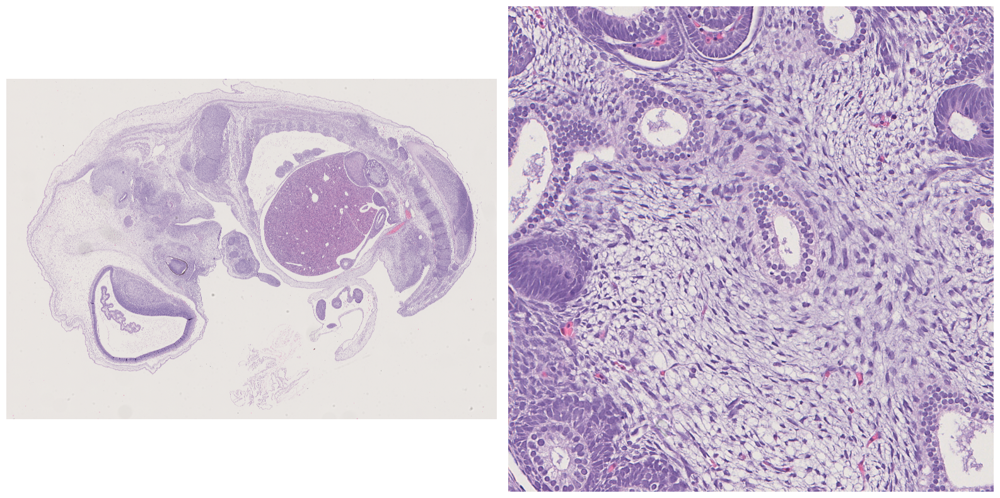

In [53]:
show_image(imgs[6], crop_x, crop_y, tile_size)

In [48]:
model = StarDist2D.from_pretrained('2D_versatile_he')


Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [ ]:
# img = normalize(img, 1, 99.8)
# normalizer = None

In [49]:
from csbdeep.data import Normalizer, normalize_mi_ma

class MyNormalizer(Normalizer):
    def __init__(self, mi, ma):
            self.mi, self.ma = mi, ma
    def before(self, x, axes):
        return normalize_mi_ma(x, self.mi, self.ma, dtype=np.float32)
    def after(*args, **kwargs):
        assert False
    @property
    def do_after(self):
        return False

# mi, ma = np.percentile(img[::8], [1,99.8])                      # compute percentiles from low-resolution image
# mi, ma = np.percentile(img[13000:16000,13000:16000], [1,99.8])  # compute percentiles from smaller crop
mi, ma = 0, 255                                                   # use min and max dtype values (suitable here)
normalizer = MyNormalizer(mi, ma)

In [16]:
help(model.predict_instances_big)

Help on method predict_instances_big in module stardist.models.base:

predict_instances_big(img, axes, block_size, min_overlap, context=None, labels_out=None, labels_out_dtype=<class 'numpy.int32'>, show_progress=True, **kwargs) method of stardist.models.model2d.StarDist2D instance
    Predict instance segmentation from very large input images.
    
    Intended to be used when `predict_instances` cannot be used due to memory limitations.
    This function will break the input image into blocks and process them individually
    via `predict_instances` and assemble all the partial results. If used as intended, the result
    should be the same as if `predict_instances` was used directly on the whole image.
    
    **Important**: The crucial assumption is that all predicted object instances are smaller than
                   the provided `min_overlap`. Also, it must hold that: min_overlap + 2*context < block_size.
    
    Example
    -------
    >>> img.shape
    (20000, 20000)
    >>

In [51]:
#Slow - takes time to segment the large image

img = imgs[6]

labels, polys = model.predict_instances_big(img, axes='YXC', block_size=4096, min_overlap=128, context=128,
                                            normalizer=normalizer, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 70/70 [08:21<00:00,  7.17s/it]


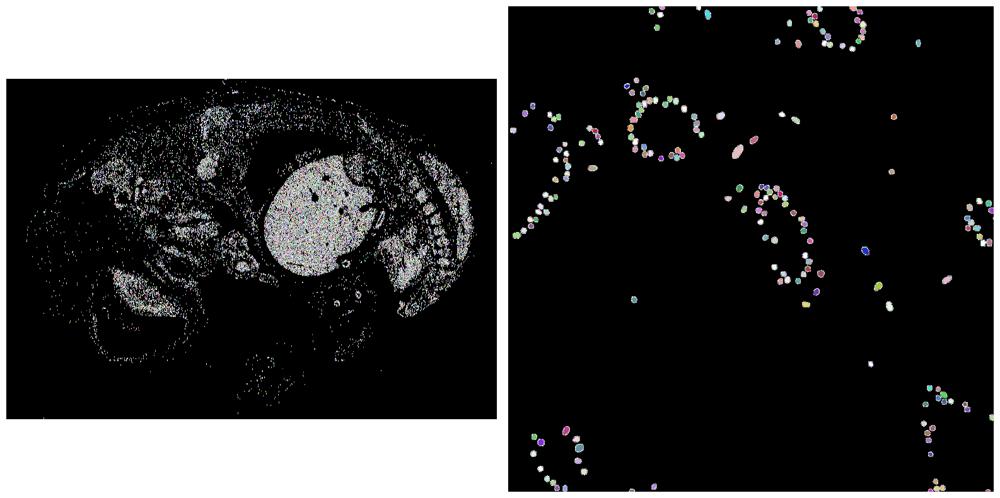

In [56]:
show_image(labels, crop_x, crop_y, tile_size, cmap=cmap)

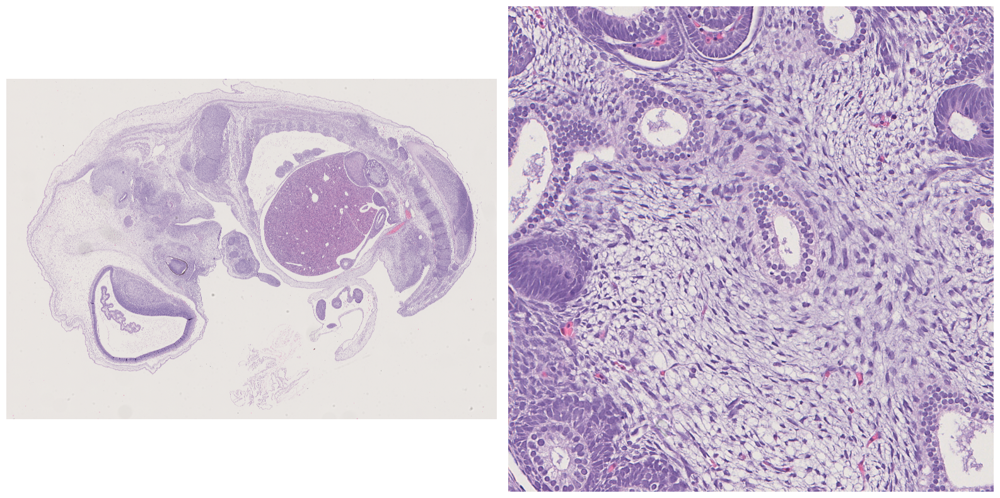

In [57]:
show_image(imgs[6], crop_x, crop_y, tile_size)

In [71]:
def show_tile(tile, **kwargs):
    """Plot a single image."""
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    ax.imshow(tile, **kwargs)
    plt.tight_layout()
    ax.set_axis_off()
    plt.show()

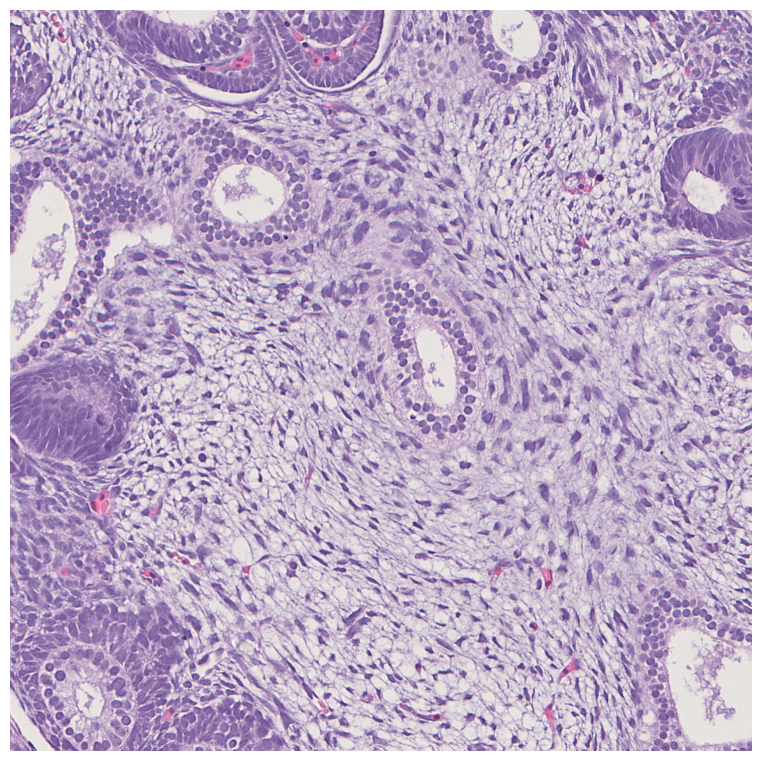

In [72]:
tiles_path = r'\\10.99.68.178\andreex\data\monkey fetus\gestational 40\1024tiles\tiles\tiffs'
tiles = [_ for _ in os.listdir(tiles_path) if _.endswith('tiff')]

tile = os.path.join(tiles_path, tiles[6])
tile_im = imread(tile)

show_tile(tile_im)

In [80]:
labels, polys = model.predict_instances(tile_im, normalizer=normalizer)

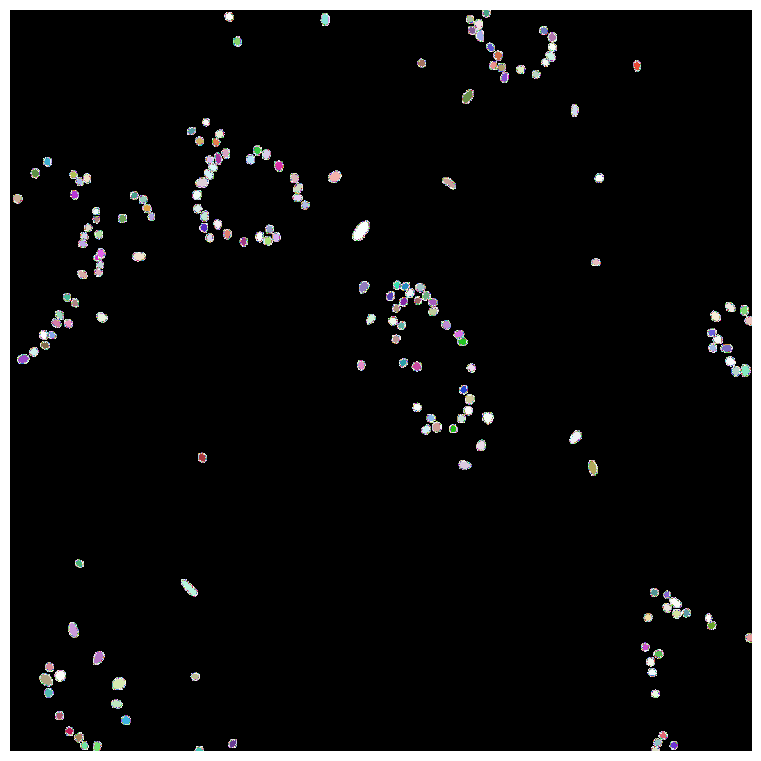

In [81]:
show_tile(labels, cmap = cmap)

In [ ]:
class MyNormalizer(Normalizer):
    def __init__(self, mi, ma):
            self.mi, self.ma = mi, ma
    def before(self, x, axes):
        return normalize_mi_ma(x, self.mi, self.ma, dtype=np.float32)
    def after(*args, **kwargs):
        assert False
    @property
    def do_after(self):
        return False

# mi, ma = np.percentile(img[::8], [1,99.8])                      # compute percentiles from low-resolution image
# mi, ma = np.percentile(img[13000:16000,13000:16000], [1,99.8])  # compute percentiles from smaller crop
mi, ma = 0, 255                                                   # use min and max dtype values (suitable here)
normalizer = MyNormalizer(mi, ma)

In [121]:
class MyNormalizer2(Normalizer):
    def __init__(self, mi, ma):
            self.mi, self.ma = mi, ma
    def before(self, x, axes):
        return normalize_mi_ma(x, self.mi, self.ma, dtype=np.float32)
    def after(*args, **kwargs):
        assert False
    @property
    def do_after(self):
        return False

mi, ma = np.percentile(img[::8], [2,98])                      # compute percentiles from low-resolution image
# mi, ma = np.percentile(img[13000:16000,13000:16000], [1,99.8])  # compute percentiles from smaller crop
normalizer2 = MyNormalizer2(mi, ma)

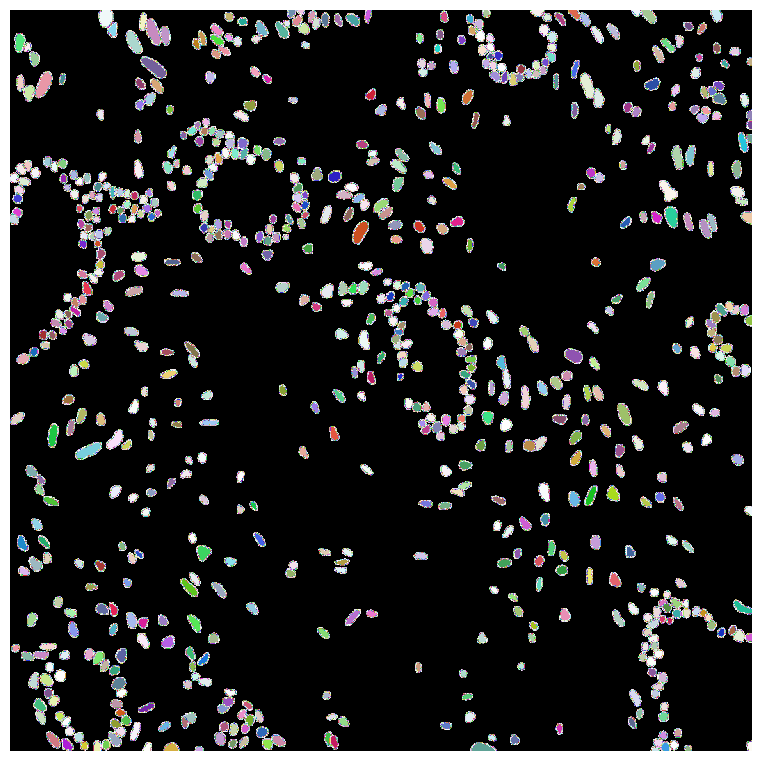

In [122]:
labels, polys = model.predict_instances(tile_im, normalizer=normalizer2)
show_tile(labels, cmap = cmap)

In [90]:
help(model.predict_instances)

Help on method _predict_instances_generator in module stardist.models.base:

_predict_instances_generator(img, axes=None, normalizer=None, sparse=True, prob_thresh=None, nms_thresh=None, scale=None, n_tiles=None, show_tile_progress=True, verbose=False, return_labels=True, predict_kwargs=None, nms_kwargs=None, overlap_label=None, return_predict=False) method of stardist.models.model2d.StarDist2D instance
    Predict instance segmentation from input image.
    
    Parameters
    ----------
    img : :class:`numpy.ndarray`
        Input image
    axes : str or None
        Axes of the input ``img``.
        ``None`` denotes that axes of img are the same as denoted in the config.
    normalizer : :class:`csbdeep.data.Normalizer` or None
        (Optional) normalization of input image before prediction.
        Note that the default (``None``) assumes ``img`` to be already normalized.
    sparse: bool
        If true, aggregate probabilities/distances sparsely during tiled
        predicti

In [93]:
result = model.predict_instances(tile_im, normalizer=normalizer2)

In [148]:
coords = result[1]['coord']
# print(len(coords[0][0]))
contours = []
for xy in coords:
    contour = []
    for i in range(len(xy[0])):
        p = [xy[0][i], xy[1][i]]  # [x, y]
        contour.append(p)
    contours.append(contour)

print(len(contours))

831


In [143]:
len(result[1]['points'])

831

Now, need to format the points / contours into json format so that it can be read into Qupath for annotations

In [135]:
import json
import geojson
from pathlib import Path

In [136]:
# correct format
type_info = Path(r"\\10.99.68.178\andreex\data\monkey fetus\gestational 40\1024tiles\hovernet_output\monkey_fetus_40_0420.json")
info = json.load(open(type_info,'r'))#

In [137]:
info

{'mag': 20,
 'nuc': {'2': {'bbox': [[5635, 5991], [5649, 6013]],
   'centroid': [6001.474226804124, 5641.546391752578],
   'contour': [[6009, 5635],
    [6008, 5636],
    [6007, 5636],
    [6006, 5637],
    [6005, 5637],
    [6004, 5638],
    [6003, 5638],
    [6002, 5639],
    [6001, 5639],
    [5998, 5642],
    [5997, 5642],
    [5993, 5646],
    [5992, 5646],
    [5991, 5647],
    [5991, 5648],
    [5995, 5648],
    [5997, 5646],
    [5998, 5646],
    [5999, 5645],
    [6000, 5645],
    [6002, 5643],
    [6003, 5643],
    [6005, 5641],
    [6006, 5641],
    [6007, 5640],
    [6008, 5640],
    [6008, 5639],
    [6009, 5638],
    [6010, 5638],
    [6011, 5637],
    [6011, 5636],
    [6012, 5635]],
   'type_prob': None,
   'type': None},
  '3': {'bbox': [[5685, 5983], [5695, 5997]],
   'centroid': [5989.452380952381, 5689.416666666667],
   'contour': [[5991, 5685],
    [5990, 5686],
    [5989, 5686],
    [5987, 5688],
    [5986, 5688],
    [5984, 5690],
    [5984, 5691],
    [5983, 569

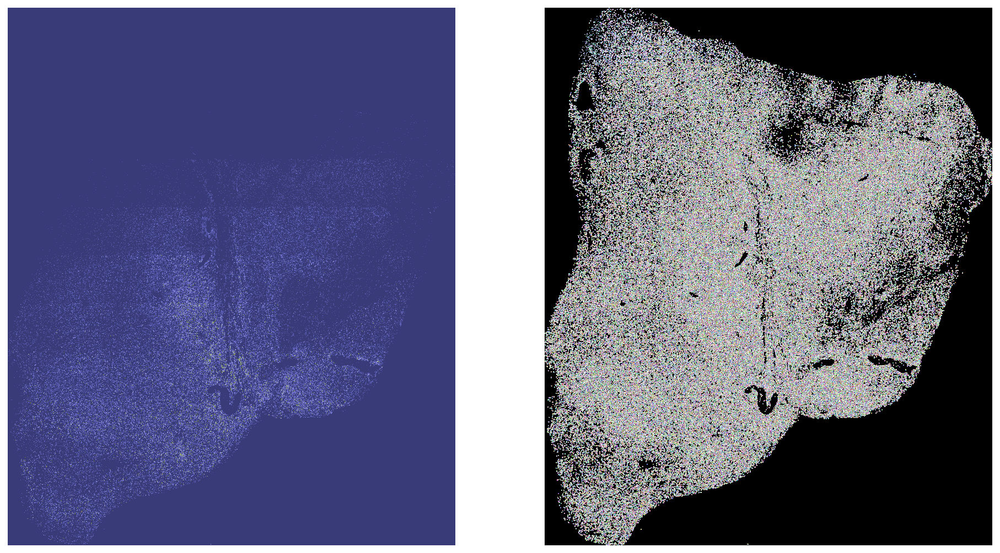

In [ ]:
fig, (a,b) = plt.subplots(1,2, figsize=(16,16))
a.imshow(labels[::8,::8], cmap='tab20b')
b.imshow(labels[::8,::8], cmap=cmap)
a.axis('off'); b.axis('off');
None;

In [ ]:
from skimage.measure import regionprops_table
import pandas as pd

In [ ]:
# Slow - takes time as we have many many objects
props = regionprops_table(labels, img, 
                          properties=['label',
                                      'area', 'equivalent_diameter',
                                      'mean_intensity', 'solidity'])

In [ ]:
analysis_results = pd.DataFrame(props)
print(analysis_results.tail())

         label  area  equivalent_diameter  mean_intensity-0  mean_intensity-1  \
228367  228368    73             9.640876        108.205479         59.260274   
228368  228369    91            10.764051        118.758242         64.054945   
228369  228370   184            15.306080        160.005435        112.010870   
228370  228371   167            14.581872        169.035928        114.850299   
228371  228372   453            24.016193        107.924945        106.300221   

        mean_intensity-2  solidity  
228367        104.205479  0.973333  
228368        110.109890  0.968085  
228369        150.103261  0.983957  
228370        152.970060  0.965318  
228371        107.591611  0.963830  


In [ ]:
import seaborn as sns

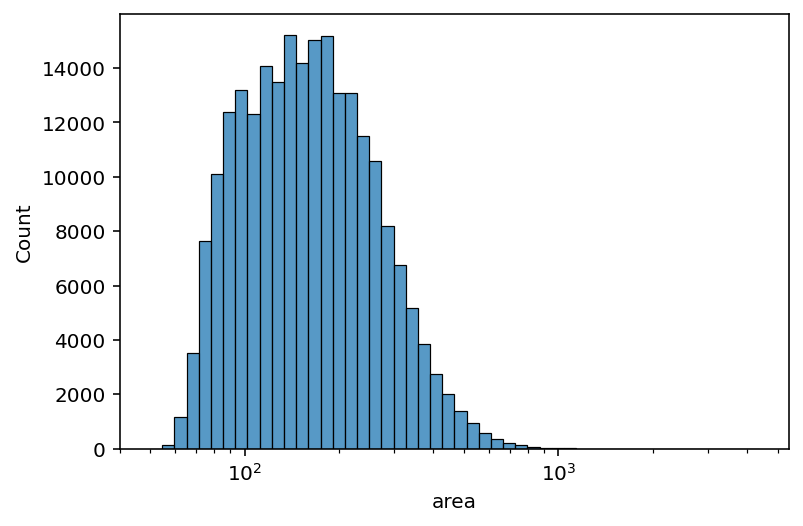

In [ ]:
sns.histplot(x="area", data=analysis_results, bins=50, log_scale=True)